In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [ ]:

# %matplotlib widget # Gebruik dit in een Jupyter Notebook

# --- 1. Data Initialisatie ---
d1  = 0.1397  # m (A tot B)
d2  = 0.1000  # m (Horizontale afstand B tot E) - PAS AAN
d3  = 0.0500  # m (Verticale afstand B tot E) - PAS AAN
r1  = 0.0508  # m (Crank AC)
r2  = 0.0862  # m (Rocker BD)
l51  = 0.0600  # m (Rocker EF) - PAS AAN (r3)       # belangrijk voor dynamica code dat l51 >= l52
r3  = 0.0500  # m (Coupler GF) - PAS AAN (r4)
l41 = 0.1524  # m (Deel 1 van coupler CDG)          # belangrijk voor dynamica code dat l41 >= l42
l42 = 0.1500  # m (Deel 2 van coupler CDG: van D naar G) - PAS AAN
r4 =l41 + l42
r6= 0.05 # m (Rocker GI) - PAS AAN 
l52 = 0.055 # m (Deel 2 van rocker FH)              # belangrijk voor dynamica code dat l51 >= l52
r5 = l51 + l52 
l71 = 0.043 # m (Deel 1 van coupler HI)
l72= 4*l71 # m (Deel 2 van coupler HI) - PAS AAN
r7 = l71+l72

# Tijd en Driver (Crank AC)
t = np.arange(0, 25, 0.1)
omega = 0.5
A_amp = 1.0
theta1 = np.pi + 1 + A_amp * np.sin(omega * t)
dtheta1 = omega * A_amp * np.cos(omega * t)
ddtheta1 = -(omega**2) * A_amp * np.sin(omega * t)


# Startwaarden voor [theta4, theta2, theta3, theta5,theta6, theta7]
x_init = [0.0, 4.2, 0.8, -0.8, 4.2,3.9]

def rotate_vector(z, theta):
    rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                                [np.sin(theta),  np.cos(theta)]])
    return np.dot(rotation_matrix, z)

# --- 2. Positie Analyse (Loop Closure) ---

def loop_closure_eqs(x, th1, d1, d2, d3, r1, r2, r3, l51, l41, l42, r6, l52, l71):
    th4, th2, th3, th5, th6, th7 = x

    # Lus 1: A-C-D-B
    F1 = r1*np.cos(th1) + l41*np.cos(th4) - r2*np.cos(th2) - d1
    F2 = r1*np.sin(th1) + l41*np.sin(th4) - r2*np.sin(th2)
    
    # Lus 2: A-C-G-F-E (G ligt in het verlengde van CD)
    # xE = d1 + d2, yE = d3
    F3 = r1*np.cos(th1) + (l41+l42)*np.cos(th4) + r3*np.cos(th3) - l51*np.cos(th5) - (d1 + d2)
    F4 = r1*np.sin(th1) + (l41+l42)*np.sin(th4) + r3*np.sin(th3) - l51*np.sin(th5) + d3

    # Lus 3: A-C-G-I-H - (F) - E (G ligt in het verlengde van CD)
    # xE = d1 + d2, yE = d3
    #F5 = r1*np.cos(th1) + (l41+l42)*np.cos(th4) + r6*np.cos(th6) + l71* np.cos(th7)- (l52+l51)*np.cos(th5) - (d1 + d2)
    #F6 = r1*np.sin(th1) + (l41+l42)*np.sin(th4) + r6*np.sin(th6) -l71*np.sin(th7)- (l51+l52)*np.sin(th5) + d3
    # Lus 3: A-C-G-I-H en E-F-H
    # We stellen het punt H (het knooppunt) gelijk via twee wegen.
    F5 = r1*np.cos(th1) + (l41+l42)*np.cos(th4) + r6*np.cos(th6) + l71*np.cos(th7) - (l51+l52)*np.cos(th5) - (d1 + d2)
    F6 = r1*np.sin(th1) + (l41+l42)*np.sin(th4) + r6*np.sin(th6) + l71*np.sin(th7) - (l51+l52)*np.sin(th5) + d3
    return [F1, F2, F3, F4, F5, F6]

# --- 3. Kinematica Berekening ---
def solve_kinematics():
    t_size = len(t)
    # Arrays voor resultaten (4 onbekenden)
    res_theta = np.zeros((t_size, 6))
    res_dtheta = np.zeros((t_size, 6))
    res_ddtheta = np.zeros((t_size, 6))
    cond = np.zeros((t_size,6))
    
    curr_x_init = x_init

    for k in range(t_size):
        # 1. Positie
        sol, info, ier, msg = fsolve(lambda x: loop_closure_eqs(x, theta1[k], d1, d2, d3, r1, r2, r3, l51, l41, l42, r6, l52, l71), 
                                     curr_x_init, full_output=True)
        res_theta[k] = sol
        th4, th2, th3, th5, th6, th7 = sol

        # 2. Snelheid (A * dtheta = B)
        # De matrix A is de Jacobiaan (afgeleiden naar th4, th2, th3, th5)
        A_mat = np.array([
            [-l41*np.sin(th4),      r2*np.sin(th2),      0,               0,               0,               0],
            [ l41*np.cos(th4),     -r2*np.cos(th2),      0,               0,               0,               0],
            [-(l41+l42)*np.sin(th4), 0,                 -r3*np.sin(th3),  l51*np.sin(th5),0,  0],
            [ (l41+l42)*np.cos(th4), 0,                  r3*np.cos(th3), -l51*np.cos(th5), 0, 0],
            [-(l41+l42)*np.sin(th4), 0,                 0,               (l51+l52)*np.sin(th5), -r6*np.sin(th6), -l71*np.sin(th7)],
            [ (l41+l42)*np.cos(th4), 0,                  0,              -(l51+l52)*np.cos(th5),  r6*np.cos(th6),  l71*np.cos(th7)]
        ])
        
        B_vel = np.array([
            r1 * np.sin(theta1[k]) * dtheta1[k],
            -r1 * np.cos(theta1[k]) * dtheta1[k],
            r1 * np.sin(theta1[k]) * dtheta1[k],
            -r1 * np.cos(theta1[k]) * dtheta1[k],
            r1 * np.sin(theta1[k]) * dtheta1[k],
            -r1 * np.cos(theta1[k]) * dtheta1[k]
        ])
        
        res_dtheta[k] = np.linalg.solve(A_mat, B_vel)
        cond[k]  = np.linalg.cond(A_mat)
        
        # 3. Versnelling (A * ddtheta = B_acc)
        # B_acc bevat de centripetale termen en de driver versnelling
        dth4, dth2, dth3, dth5, dth6, dth7 = res_dtheta[k]
        B_acc = np.array([
            r1*np.cos(theta1[k])*dtheta1[k]**2 + r1*np.sin(theta1[k])*ddtheta1[k] + l41*np.cos(th4)*dth4**2 - r2*np.cos(th2)*dth2**2,
            r1*np.sin(theta1[k])*dtheta1[k]**2 - r1*np.cos(theta1[k])*ddtheta1[k] + l41*np.sin(th4)*dth4**2 - r2*np.sin(th2)*dth2**2,
            r1*np.cos(theta1[k])*dtheta1[k]**2 + r1*np.sin(theta1[k])*ddtheta1[k] + (l41+l42)*np.cos(th4)*dth4**2 + r3*np.cos(th3)*dth3**2 - l51*np.cos(th5)*dth5**2,
            r1*np.sin(theta1[k])*dtheta1[k]**2 - r1*np.cos(theta1[k])*ddtheta1[k] + (l41+l42)*np.sin(th4)*dth4**2 + r3*np.sin(th3)*dth3**2 - l51*np.sin(th5)*dth5**2,
            r1*np.cos(theta1[k])*dtheta1[k]**2 + r1*np.sin(theta1[k])*ddtheta1[k] + (l41+l42)*np.cos(th4)*dth4**2 + r6*np.cos(th6)*dth6**2 + l71*np.cos(th7)*dth7**2 - (l51+l52)*np.cos(th5)*dth5**2,
            r1*np.sin(theta1[k])*dtheta1[k]**2 - r1*np.cos(theta1[k])*ddtheta1[k] + (l41+l42)*np.sin(th4)*dth4**2 + r6*np.sin(th6)*dth6**2 - l71*np.sin(th7)*dth7**2 - (l51+l52)*np.sin(th5)*dth5**2    
        ])
        
        res_ddtheta[k] = np.linalg.solve(A_mat, B_acc)
        curr_x_init = sol # Gebruik huidige oplossing voor volgende stap
        
    return res_theta, res_dtheta, res_ddtheta, cond

# Bereken alles
thetas, dthetas, ddthetas, cond = solve_kinematics()

# --- 4. Animatie ---
fig, ax = plt.subplots(figsize=(8,6))

def update(k):
    ax.cla()
    th1 = theta1[k]
    th4, th2, th3, th5, th6, th7 = thetas[k]
    
    # Punten berekenen
    A = np.array([0, 0])
    B = np.array([d1, 0])
    E = np.array([d1 + d2, -d3])
    C = A + rotate_vector([r1, 0], th1)
    D = C + rotate_vector([l41, 0], th4)
    D2 = B + rotate_vector([r2, 0], th2)
    G = C + rotate_vector([l41 + l42, 0], th4)
    F1 = E + rotate_vector([l51, 0], th5)
    F2 = G + rotate_vector([r3,0],th3)
    H = E + rotate_vector([l52+l51, 0], th5)
    I = G + rotate_vector([r6, 0], th6)
    H2 = I + rotate_vector([l71,0], th7)
    J = I + rotate_vector([l71+l72,0], th7)
    J2 = I - rotate_vector([l71+l72,0], th7)
    J3 = I + rotate_vector([-(l71+l72),0], th7)
    J4 = I + rotate_vector([l71+l72,0], -th7)
    # Tekenen
    # Lus 1: A-C-D-B
    ax.plot([A[0], C[0], D[0], D2[0], B[0]], [A[1], C[1], D[1], D2[1], B[1]], 'bo-', lw=2, label='Loop 1')
    # Lus 2: D-G-F-E
    ax.plot([D[0], G[0], F1[0], E[0]], [D[1], G[1], F1[1], E[1]], 'go-', lw=2, label='Loop 2')
    # Lus 2: D-G-F-E
    ax.plot([D[0], G[0], F2[0], E[0]], [D[1], G[1], F2[1], E[1]], 'bo-', lw=2, label='Loop 2')
     # Lus 3: G-I-H-F
    ax.plot([G[0], I[0], H[0], F1[0]], [G[1], I[1], H[1], F1[1]], 'ro-', lw=2, label='Loop 3')
     # Lus 3: G-I-H-F
    ax.plot([G[0],  I[0], H2[0], F1[0]], [G[1],  I[1], H2[1], F1[1]], 'yo-', lw=2, label='Loop 3')
    # Lus 3: I-J
    #ax.plot([I[0], J[0]], [I[1],J[1]], 'bo-', lw=2, label='extra')
    # Lus 3: I-J
    #ax.plot([I[0], J2[0]], [I[1],J2[1]], 'ro-', lw=2, label='extra')
    # Lus 3: I-J
    ax.plot([I[0], J3[0]], [I[1],J3[1]], 'yo-', lw=2, label='extra')
    # Lus 3: I-J
    #ax.plot([I[0], J4[0]], [I[1],J4[1]], 'go-', lw=2, label='extra')
    # Vaste punten
    ax.plot([A[0], B[0], E[0]], [A[1], B[1], E[1]], 'ks', markersize=10)
    
    ax.set_xlim(-0.1, 0.6)
    ax.set_ylim(-0.4, 0.1)
    ax.set_aspect('equal')
    ax.legend()
    ax.set_title(f"Tijd: {t[k]:.2f}s")

ani = FuncAnimation(fig, update, frames=len(t), interval=50)
plt.close()
HTML(ani.to_jshtml())

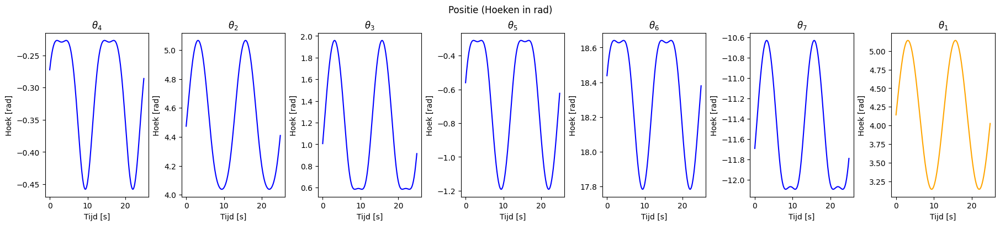

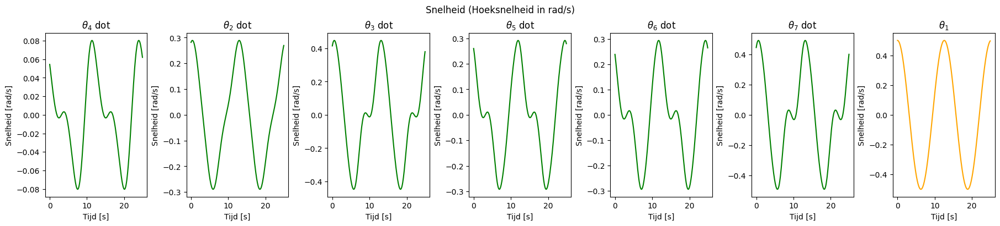

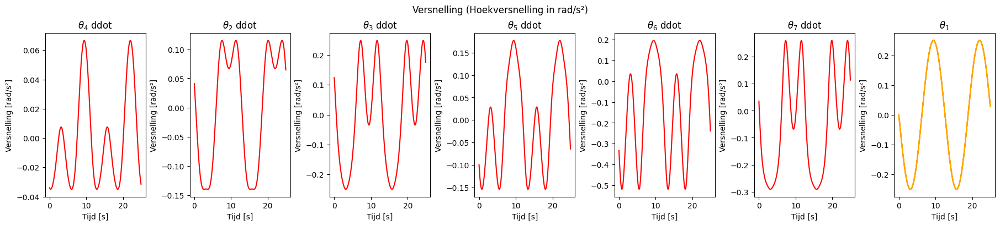

In [3]:
# --- 5. Plotten van resultaten ---

# Namen van de hoeken in de juiste volgorde (zoals in x_init/sol)
labels = [r'$\theta_4$', r'$\theta_2$', r'$\theta_3$', r'$\theta_5$', r'$\theta_6$', r'$\theta_7$', r'$\theta_1$']

# 1. POSITIE PLOTS
fig_p, ax_p = plt.subplots(1, 7, figsize=(18, 4), constrained_layout=True)
fig_p.suptitle("Positie (Hoeken in rad)")

for i in range(6):
    ax_p[i].plot(t, thetas[:, i], color='blue')
    ax_p[i].set_title(labels[i])
    ax_p[i].set_xlabel("Tijd [s]")
    ax_p[i].set_ylabel("Hoek [rad]")
ax_p[6].plot(t,theta1, color='orange')
ax_p[6].set_title(labels[6])
ax_p[6].set_xlabel("Tijd [s]")
ax_p[6].set_ylabel("Hoek [rad]")

# 2. SNELHEID PLOTS (Eerste afgeleide)
fig_v, ax_v = plt.subplots(1, 7, figsize=(18, 4), constrained_layout=True)
fig_v.suptitle("Snelheid (Hoeksnelheid in rad/s)")

for i in range(6):
    ax_v[i].plot(t, dthetas[:, i], color='green')
    ax_v[i].set_title(labels[i] + " dot")
    ax_v[i].set_xlabel("Tijd [s]")
    ax_v[i].set_ylabel("Snelheid [rad/s]")
ax_v[6].plot(t, dtheta1, color='orange')
ax_v[6].set_title(labels[6])
ax_v[6].set_xlabel("Tijd [s]")
ax_v[6].set_ylabel("Snelheid [rad/s]")


# 3. VERSNELLING PLOTS (Tweede afgeleide)
fig_a, ax_a = plt.subplots(1, 7, figsize=(18, 4), constrained_layout=True)
fig_a.suptitle("Versnelling (Hoekversnelling in rad/s²)")

for i in range(6):
    ax_a[i].plot(t, ddthetas[:, i], color='red')
    ax_a[i].set_title(labels[i] + " ddot")
    ax_a[i].set_xlabel("Tijd [s]")
    ax_a[i].set_ylabel("Versnelling [rad/s²]")
    ax_a[6].plot(t, ddtheta1, color= 'orange')
ax_a[6].set_title(labels[6])
ax_a[6].set_xlabel("Tijd [s]")
ax_a[6].set_ylabel("Versnelling [rad/s²]")


plt.show()

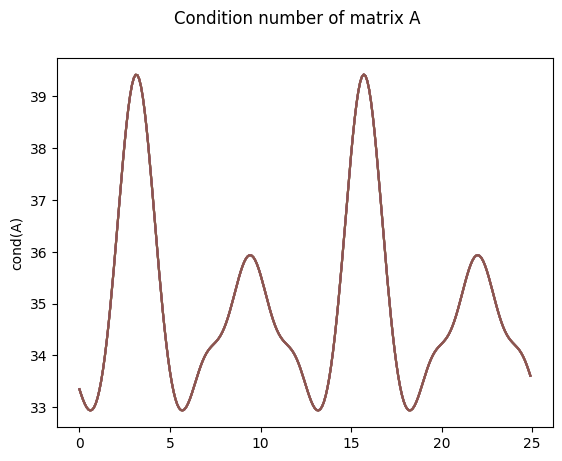

In [4]:
# plot of condition number:
figc, axc = plt.subplots()
figc.suptitle("Condition number of matrix A")

axc.plot(t, cond)
axc.set_ylabel("cond(A)")
plt.show()


In [5]:
# RUN DIT NIET AFZONDERLIJK!!!!

b = 7   # aantal stangen

# dynamic parameters, defined in a local frame on each of the bars:
r5 = l51 + l52
x1 = r1/2
x2 = r2 / 2    # X coordinates of cog (centre of gravity)
x3 = r3 / 2
x4 = r4 / 2
x5 = r5 / 2
x6 = r6 / 2
x7 = r7 / 2 
X = [x1, x2, x3, x4, x5, x6, x7]
#Xl41???

y1 = 0
y2 = 0         # Y coordinates of cog
y3 = 0  
y4 = 0
y5 = 0
y6 = 0
y7 = 0
Y = [y1, y2, y3, y4, y5, y6, y7]

m1 = r1 * 15.4
m2 = r2 * 15.4 # mass of round steel bar of 5cm diameter
m3 = r3 * 15.4
m4 = r4 * 15.4
m5 = r5* 15.4
m6 = r6 * 15.4
m7 = r7* 15.4
M = [m1, m2, m3, m4, m5, m6, m7]

# moments of inertia at center of mass (formula of a thin rod):
J1 = m1 * r1 ** 2 / 12
J2 = m2 * r2 ** 2 / 12
J3 = m3 * r3 ** 2 / 12
J4 = m4 * r4 ** 2 / 12
J5 = m5 * r5 ** 2 / 12
J6 = m6 * r6 ** 2 / 12
J7 = m7 * r7 ** 2 / 12

# om de volgorde van de thetas de fixen
# Startwaarden voor [theta4, theta2, theta3, theta5,theta6, theta7]
# x_init = [0.0, 4.2, 0.8, -0.8, 4.2,3.9]

THETAS = [theta1]  
theta2 = thetas[:, 1]
theta3 = thetas[:, 2]
theta4 = thetas[:, 0]
theta5 = thetas[:, 3]
theta6 = thetas[:, 4]
theta7 = thetas[:, 5]
THETAS.append(theta2)
THETAS.append(theta3)
THETAS.append(theta4)
THETAS.append(theta5)
THETAS.append(theta6)
THETAS.append(theta7)
thetas = THETAS

th1, th2, th3, th4, th5, th6, th7 = thetas

#  RUN DIT NIET AFZONDERLIJK!!!!

In [6]:
# fix dthetas

DTHETAS = [dtheta1]  
dtheta2 = dthetas[:, 1]
dtheta3 = dthetas[:, 2]
dtheta4 = dthetas[:, 0]
dtheta5 = dthetas[:, 3]
dtheta6 = dthetas[:, 4]
dtheta7 = dthetas[:, 5]
DTHETAS.append(dtheta2)
DTHETAS.append(dtheta3)
DTHETAS.append(dtheta4)
DTHETAS.append(dtheta5)
DTHETAS.append(dtheta6)
DTHETAS.append(dtheta7)
dthetas = DTHETAS

In [7]:
# de ddthetas opstellen

DDTHETAS = [ddtheta1]  
ddtheta2 = ddthetas[:, 1]
ddtheta3 = ddthetas[:, 2]
ddtheta4 = ddthetas[:, 0]
ddtheta5 = ddthetas[:, 3]
ddtheta6 = ddthetas[:, 4]
ddtheta7 = ddthetas[:, 5]
DDTHETAS.append(ddtheta2)
DDTHETAS.append(ddtheta3)
DDTHETAS.append(ddtheta4)
DDTHETAS.append(ddtheta5)
DDTHETAS.append(ddtheta6)
DDTHETAS.append(ddtheta7)
ddthetas = DDTHETAS


In [8]:
# formulas for inverse dynamics:
def dynamica_pantograaf (thetas, dthetas, ddthetas, r1, r2, r3, r4, r5, r6, r7, m1, m2, m3, m4, m5, m6, m7, x1, x2, x3, x4, x5, x6, x7, y1, y2, y3, y4, y5, y6, y7, J1, J2, J3, J4, J5, J6, J7, t ):

    J = [J1, J2, J3, J4, J5, J6, J7]
    th1, th2, th3, th4, th5, th6, th7 = thetas
    dth1, dth2, dth3, dth4, dth5, dth6, dth7 = dthetas
    ddth1, ddth2, ddth3, ddth4, ddth5, ddth6, ddth7 = ddthetas
    
    # definities voor de vectoren van de zwaartepunten (center of gravity = cog)
    # definities voor hoeksnelheden (omega) en hoekversnellingen (alpha)
    # met het punt waaruit de hoek gemeten wordt als referentie, dwz deze zijn allemaal relatieve coordinaten
    COG_X = []
    COG_Y = []
    OMEGA = []
    ALPHA = []
    for i in range(b):
        x_coordinaat = X[i] * np.cos(thetas[i]) + Y[i] * np.cos(thetas[i] + np.pi / 2)
        COG_X.append(x_coordinaat)
        y_coordinaat = X[i] * np.sin(thetas[i]) + Y[i] * np.sin(thetas[i] + np.pi / 2)
        COG_Y.append(y_coordinaat)
        omega_i = np.column_stack((np.zeros_like(th1), np.zeros_like(th1), dthetas[i]))
        OMEGA.append(omega_i)
        alpha_i = np.column_stack((np.zeros_like(th1), np.zeros_like(th1), ddthetas[i]))
        ALPHA.append(alpha_i)

    # definities voor de vectoren van de zwaartepunten (center of gravity = cog), met referentiepunten die we willen
    # bv cog1_Ax is de x-coordinaat van stang 1 tov A
    # beschouw een relatief assenstelsel vanuit A in absoluut stelsel vanuit C: cog_C = coordinaat van A tov C + cog_A    met coordinaat van A = -coordinaat van C tov A
    # 

    cog1_Ax = COG_X[0]
    cog1_Ay = COG_Y[0]
    cog1_Cx = -r1 * np.cos(th1) + cog1_Ax
    cog1_Cy = -r1 * np.sin(th1) + cog1_Ay
    cog2_Bx = COG_X[1]
    cog2_By = COG_Y[1]
    cog2_Dx = -r2 * np.cos(th2) + cog2_Bx
    cog2_Dy = -r2 * np.sin(th2) + cog2_By
    cog3_Gx = COG_X[2]
    cog3_Gy = COG_Y[2]
    cog3_Fx = -r3 * np.cos(th3) + cog3_Gx
    cog3_Fy = -r3 * np.sin(th3) + cog3_Gy
    cog4_Cx = COG_X[3]
    cog4_Cy = COG_Y[3]
    cog4_Dx = -l41 * np.cos(th4) + cog4_Cx
    cog4_Dy = -l41 * np.sin(th4) + cog4_Cy
    cog4_Gx = -r4 * np.cos(th4) + cog4_Cx
    cog4_Gy = -r4 * np.sin(th4) + cog4_Cy
    cog5_Ex = COG_X[4]
    cog5_Ey = COG_Y[4]
    cog5_Fx = -l51 * np.cos(th5) + cog5_Ex
    cog5_Fy = -l51 * np.sin(th5) + cog5_Ey
    cog5_Hx = -r5 * np.cos(th5) + cog5_Ex
    cog5_Hy = -r5 * np.sin(th5) + cog5_Ey
    cog6_Gx = COG_X[5]
    cog6_Gy = COG_Y[5]
    cog6_Ix = -r6 * np.cos(th6) + cog6_Gx
    cog6_Iy = -r6 * np.sin(th6) + cog6_Gy
    cog7_Hx = COG_X[6]
    cog7_Hy = COG_Y[6]
    cog7_Ix = -l71 * np.cos(th7) + cog7_Hx
    cog7_Iy = -l71 * np.sin(th7) + cog7_Hy

    # plaatsvectoren in een 3D ruimte
    # for lus voor de relatieve vectoren naar de cog
    cog1_A_vec = np.column_stack((cog1_Ax, cog1_Ay, np.zeros_like(th1)))
    cog1_C_vec = np.column_stack((cog1_Cx, cog1_Cy, np.zeros_like(th1)))
    cog2_B_vec = np.column_stack((cog2_Bx, cog2_By, np.zeros_like(th1)))
    cog2_D_vec = np.column_stack((cog2_Dx, cog2_Dy, np.zeros_like(th1)))
    cog3_F_vec = np.column_stack((cog3_Fx, cog3_Fy, np.zeros_like(th1)))
    cog3_G_vec = np.column_stack((cog3_Gx, cog3_Gy, np.zeros_like(th1)))
    cog4_C_vec = np.column_stack((cog4_Cx, cog4_Cy, np.zeros_like(th1)))
    cog4_D_vec = np.column_stack((cog4_Dx, cog4_Dy, np.zeros_like(th1)))
    cog4_G_vec = np.column_stack((cog4_Gx, cog4_Gy, np.zeros_like(th1)))
    cog5_E_vec = np.column_stack((cog5_Ex, cog5_Ey, np.zeros_like(th1)))
    cog5_F_vec = np.column_stack((cog5_Fx, cog5_Fy, np.zeros_like(th1)))
    cog5_H_vec = np.column_stack((cog5_Hx, cog5_Hy, np.zeros_like(th1)))
    cog6_G_vec = np.column_stack((cog6_Gx, cog6_Gy, np.zeros_like(th1)))
    cog6_I_vec = np.column_stack((cog6_Ix, cog6_Iy, np.zeros_like(th1)))
    cog7_H_vec = np.column_stack((cog7_Hx, cog7_Hy, np.zeros_like(th1)))
    cog7_I_vec = np.column_stack((cog7_Ix, cog7_Iy, np.zeros_like(th1)))
    CG_vec = np.column_stack((r4 * np.cos(th4), r4 * np.sin(th4), np.zeros_like(th1)))
    AC_vec = np.column_stack((r1 * np.cos(th1), r1 * np.sin(th1), np.zeros_like(th1)))
    EH_vec = np.column_stack((r5 * np.cos(th5), r5 * np.sin(th5), np.zeros_like(th1)))

    # versnellingsvectoren
    acc1 = np.cross(ALPHA[0], cog1_A_vec) + np.cross(OMEGA[0], np.cross(OMEGA[0], cog1_A_vec))
    acc2 = np.cross(ALPHA[1], cog2_B_vec) + np.cross(OMEGA[1], np.cross(OMEGA[1], cog2_B_vec))
    accC = np.cross(ALPHA[0], AC_vec) + np.cross(OMEGA[0], np.cross(OMEGA[0], AC_vec))
    accG = accC + np.cross(ALPHA[3], CG_vec) + np.cross(OMEGA[3], np.cross(OMEGA[3], CG_vec))
    acc3 = accG + np.cross(ALPHA[2], cog3_G_vec) + np.cross(OMEGA[2], np.cross(OMEGA[2], cog3_G_vec))
    acc4 = accC + np.cross(ALPHA[3], cog4_C_vec) + np.cross(OMEGA[3], np.cross(OMEGA[3], cog4_C_vec))
    acc5 = np.cross(ALPHA[4], cog5_E_vec) + np.cross(OMEGA[4], np.cross(OMEGA[4], cog5_E_vec))
    acc6 = accG + np.cross(ALPHA[5], cog6_G_vec) + np.cross(OMEGA[5], np.cross(OMEGA[5], cog6_G_vec))
    accH = np.cross(ALPHA[4], EH_vec) + np.cross(OMEGA[4], np.cross(OMEGA[4], EH_vec))
    acc7 = accH + np.cross(ALPHA[6], cog7_H_vec) + np.cross(OMEGA[6], np.cross(OMEGA[6], cog7_H_vec))

    # versnellingsvectoren opdelen in x en y componenten om in de b vector van Ax=b te steken met F=ma
    acc1x = acc1[:, 0]
    acc1y = acc1[:, 1]
    acc2x = acc2[:, 0]
    acc2y = acc2[:, 1]
    acc3x = acc3[:, 0]
    acc3y = acc3[:, 1]
    acc4x = acc4[:, 0]
    acc4y = acc4[:, 1]
    acc5x = acc5[:, 0]
    acc5y = acc5[:, 1]
    acc6x = acc6[:, 0]
    acc6y = acc6[:, 1]
    acc7x = acc7[:, 0]
    acc7y = acc7[:, 1]

    # Calculate dynamics for each time step
    t_size = len(t)
    for k in range(t_size):
        A = np.array([[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],        # vgl voor x richting van stang 1
                      [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],        # vgl voor y richting van stang 1
                      [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],        # x stang 2
                      [0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],        # y stang 2
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],        # x stang 3
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0],        # y stang 3
                      [0, 0, 0, 0, -1, 0, -1, 0, 0, 0, 0, 0, -1, 0, -1, 0, 0, 0, 0, 0, 0],        # x stang 4
                      [0, 0, 0, 0, 0, -1, 0, -1, 0, 0, 0, 0, 0, -1, 0, -1, 0, 0, 0, 0, 0],        # y stang 4
                      [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, -1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],        # x stang 5
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, -1, 0, 0, 0, 0, 0, 1, 0, 0, 0],        # y stang 5
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0],        # x stang 6
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0],        # y stang 6
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, -1, 0, 0],        # x stang 7
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, -1, 0],        # y stang 7
                      [cog1_Ay[k], -cog1_Ax[k], 0, 0, cog1_Cy[k], -cog1_Cx[k], 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],     # momentvgl van stang 1
                      [0, 0, cog2_By[k], -cog2_Bx[k], 0, 0, cog2_Dy[k], -cog2_Dx[k], 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -cog3_Fy[k], cog3_Fx[k], cog3_Gy[k], -cog3_Gx[k], 0, 0, 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, cog4_Cy[k], -cog4_Cx[k], cog4_Dy[k], -cog4_Dx[k], 0, 0, 0, 0, cog4_Gy[k], -cog4_Gx[k], cog4_Gy[k], -cog4_Gx[k], 0, 0, 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, -cog5_Ey[k], cog5_Ex[k], cog5_Fy[k], -cog5_Fx[k], 0, 0, 0, 0, cog5_Hy[k], -cog5_Hx[k], 0, 0, 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -cog6_Gy[k], cog6_Gx[k], 0, 0, cog6_Iy[k], -cog6_Ix[k], 0],
                      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, cog7_Hy[k], -cog7_Hx[k], cog7_Iy[k], -cog7_Ix[k], 0]])

        B = np.array([m1 * acc1x[k],
                      m1 * acc1y[k],
                      m2 * acc2x[k],
                      m2 * acc2y[k],
                      m3 * acc3x[k],
                      m3 * acc3y[k],
                      m4 * acc4x[k],
                      m4 * acc4y[k],
                      m5 * acc5x[k],
                      m5 * acc5y[k],
                      m6 * acc6x[k],
                      m6 * acc6y[k],
                      m7 * acc7x[k],
                      m7 * acc7y[k],
                      J1 * ddth1[k],
                      J2 * ddth2[k],
                      J3 * ddth3[k],
                      J4 * ddth4[k],
                      J5 * ddth5[k],
                      J6 * ddth6[k],
                      J7 * ddth7[k]])

        x = np.linalg.lstsq(A, B, rcond=None)[0]

      # Save results
        F_Ax[k] = x[0]
        F_Ay[k] = x[1]
        F_Bx[k] = x[2]
        F_By[k] = x[3]
        F_Cx[k] = x[4]
        F_Cy[k] = x[5]
        F_Dx[k] = x[6]
        F_Dy[k] = x[7]
        F_Ex[k] = x[8]
        F_Ey[k] = x[9]
        F_Fx[k] = x[10]
        F_Fy[k] = x[11]
        F_G34x[k] = x[12]       # reactiekracht van stang 3 op vier omdat er 3 stangen samenkomen op dat scharnierpunt
        F_G34y[k] = x[13]
        F_G64x[k] = x[14]       # reactiekracht van stang 6 op 4
        F_G64y[k] = x[15]
        F_Hx[k] = x[16]
        F_Hy[k] = x[17]
        F_Ix[k] = x[18]
        F_Iy[k] = x[19]
        M_A[k] = x[20]

    return F_Ax, F_Ay, F_Bx, F_By, F_Cx, F_Cy, F_Dx, F_Dy, F_Ex, F_Ey, F_Fx, F_Fy, F_G34x, F_G34y, F_G64x, F_G64y, F_Hx, F_Hy, F_Ix, F_Iy, M_A

# compute inverse dynamics:
# Allocate matrices for force (F) and moment (M)
F_Ax = np.zeros_like(t)
F_Ay = np.zeros_like(t) 
F_Bx = np.zeros_like(t)  
F_By = np.zeros_like(t)  
F_Cx = np.zeros_like(t)
F_Cy = np.zeros_like(t)
F_Dx = np.zeros_like(t)
F_Dy = np.zeros_like(t)
F_Ex = np.zeros_like(t)
F_Ey = np.zeros_like(t)
F_Fx = np.zeros_like(t)
F_Fy = np.zeros_like(t)
F_G34x = np.zeros_like(t)
F_G34y = np.zeros_like(t)
F_G64x = np.zeros_like(t)
F_G64y = np.zeros_like(t)
F_Hx = np.zeros_like(t)
F_Hy = np.zeros_like(t)
F_Ix = np.zeros_like(t)
F_Iy = np.zeros_like(t)
M_A = np.zeros_like(t)

[F_Ax, F_Ay, F_Bx, F_By, F_Cx, F_Cy, F_Dx, F_Dy, F_Ex, F_Ey, F_Fx, F_Fy, F_G34x, F_G34y, F_G64x, F_G64y, F_Hx, F_Hy, F_Ix, F_Iy, M_A] = dynamica_pantograaf(thetas, dthetas, ddthetas, r1, r2, r3, r4, r5, r6, r7, m1, m2, m3, m4, m5, m6, m7, x1, x2, x3, x4, x5, x6, x7, y1, y2, y3, y4, y5, y6, y7, J1, J2, J3, J4, J5, J6, J7, t )

F_Gx = -F_G34x - F_G64x
F_Gy = -F_G34y - F_G64y

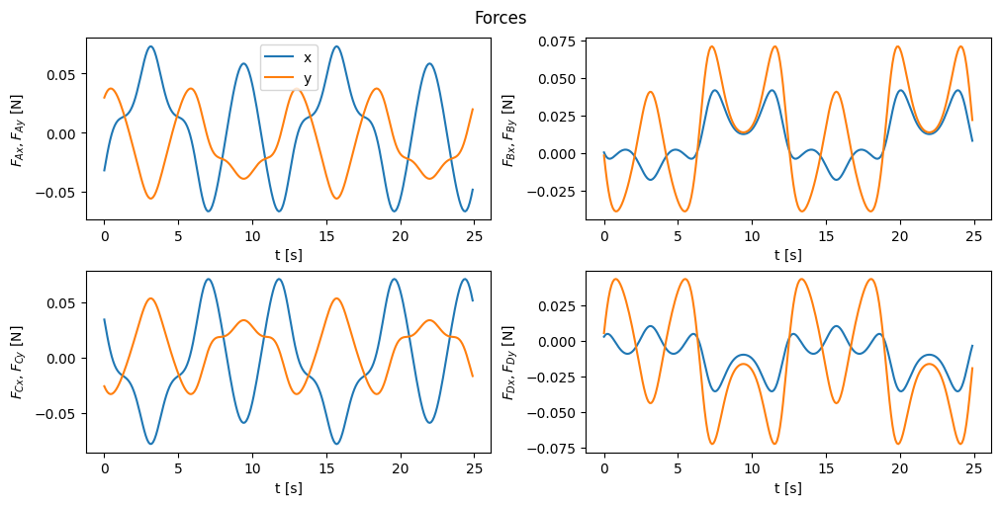

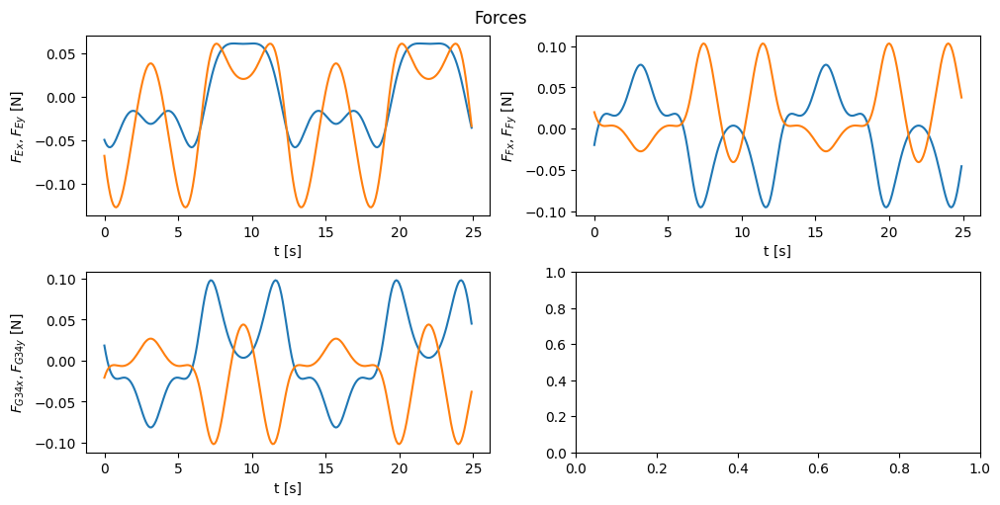

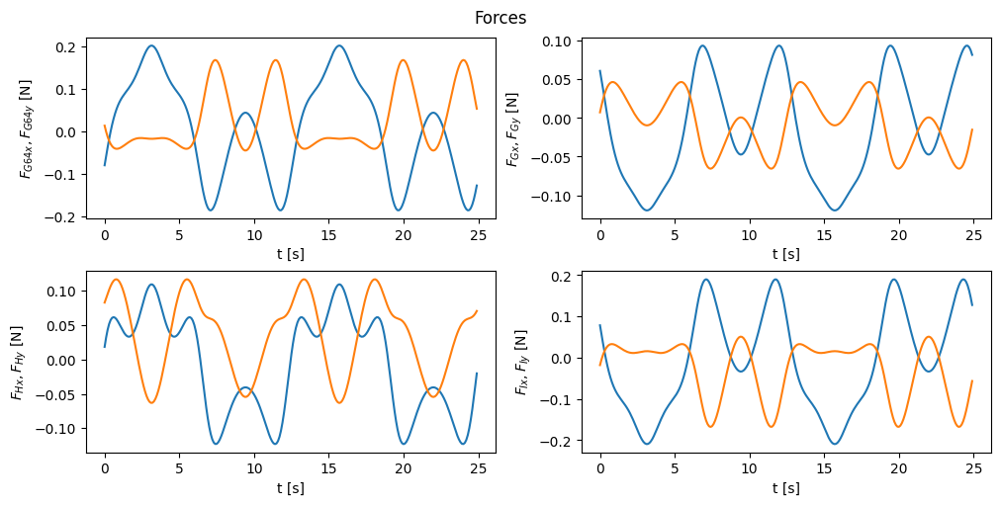

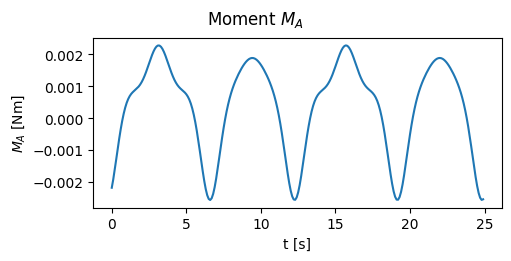

In [9]:
# plot forces and moments:
fig2, ax2 = plt.subplots(nrows=2,ncols=2,constrained_layout=True, figsize=(10,5))
fig2.suptitle("Forces")

ax2[0,0].plot(t, F_Ax, label="x")
ax2[0,0].plot(t, F_Ay, label="y")
ax2[0,0].set_ylabel(r'$F_{Ax}, F_{Ay}$ [N]')
ax2[0,0].set_xlabel('t [s]')
ax2[0,0].legend()

ax2[0,1].plot(t, F_Bx)
ax2[0,1].plot(t, F_By)
ax2[0,1].set_ylabel(r'$F_{Bx}, F_{By}$ [N]')
ax2[0,1].set_xlabel('t [s]')

ax2[1,0].plot(t, F_Cx)
ax2[1,0].plot(t, F_Cy)
ax2[1,0].set_ylabel(r'$F_{Cx}, F_{Cy}$ [N]')
ax2[1,0].set_xlabel('t [s]')

ax2[1,1].plot(t, F_Dx)
ax2[1,1].plot(t, F_Dy)
ax2[1,1].set_ylabel(r'$F_{Dx}, F_{Dy}$ [N]')
ax2[1,1].set_xlabel('t [s]')

plt.show()

fig3, ax3 = plt.subplots(nrows=2,ncols=2,constrained_layout=True, figsize=(10,5))
fig3.suptitle("Forces")

ax3[0,0].plot(t, F_Ex, label="x")
ax3[0,0].plot(t, F_Ey, label="y")
ax3[0,0].set_ylabel(r'$F_{Ex}, F_{Ey}$ [N]')
ax3[0,0].set_xlabel('t [s]')

ax3[0,1].plot(t, F_Fx, label="x")
ax3[0,1].plot(t, F_Fy, label="y")
ax3[0,1].set_ylabel(r'$F_{Fx}, F_{Fy}$ [N]')
ax3[0,1].set_xlabel('t [s]')

ax3[1,0].plot(t, F_G34x, label="x")
ax3[1,0].plot(t, F_G34y, label="y")
ax3[1,0].set_ylabel(r'$F_{G34x}, F_{G34y}$ [N]')
ax3[1,0].set_xlabel('t [s]')

plt.show()

fig4, ax4 = plt.subplots(nrows=2,ncols=2,constrained_layout=True, figsize=(10,5))
fig4.suptitle("Forces")

ax4[0,0].plot(t, F_G64x, label="x")
ax4[0,0].plot(t, F_G64y, label="y")
ax4[0,0].set_ylabel(r'$F_{G64x}, F_{G64y}$ [N]')
ax4[0,0].set_xlabel('t [s]')

ax4[0,1].plot(t, F_Gx, label="x")
ax4[0,1].plot(t, F_Gy, label="y")
ax4[0,1].set_ylabel(r'$F_{Gx}, F_{Gy}$ [N]')
ax4[0,1].set_xlabel('t [s]')

ax4[1,0].plot(t, F_Hx, label="x")
ax4[1,0].plot(t, F_Hy, label="y")
ax4[1,0].set_ylabel(r'$F_{Hx}, F_{Hy}$ [N]')
ax4[1,0].set_xlabel('t [s]')

ax4[1,1].plot(t, F_Ix, label="x")
ax4[1,1].plot(t, F_Iy, label="y")
ax4[1,1].set_ylabel(r'$F_{Ix}, F_{Iy}$ [N]')
ax4[1,1].set_xlabel('t [s]')

plt.show()

fig5, ax5 = plt.subplots(constrained_layout=True, figsize=(5,2.5))
fig5.suptitle("Moment $M_A$")

ax5.plot(t, M_A)
ax5.set_ylabel(r'$M_A$ [Nm]')
ax5.set_xlabel('t [s]')

plt.show()
